# Phase 5: Final Integration and Explainable AI

## Wildfire Detection using Multi-Spectral Satellite Imagery

This notebook demonstrates the final integrated pipeline using **actual Landsat-8 imagery** from the Active Fire dataset.

**Contents:**
1. Fire patch detection visualizations (real satellite images)
2. Multi-spectral band analysis
3. Grad-CAM explainability analysis
4. Model comparison and performance metrics

**Dataset:** North America and South America Active Fire Detection (Landsat-8)  
**Technical Novelties:** Uncertainty Modeling, Spectral Attention, Calibration

In [1]:
import sys
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from PIL import Image
import warnings
warnings.filterwarnings('ignore')

sys.path.insert(0, '.')
from src.utils.phase5_real_utils import (
    load_real_metrics, load_fire_patch_image, load_band_analysis_image,
    load_gradcam_image, get_available_visualizations, print_real_metrics
)

np.random.seed(42)

viz_counts = get_available_visualizations()
print()
print(f"Available visualizations:")
print(f"  Fire patch analyses: {viz_counts['fire_patches']}")
print(f"  Band analyses: {viz_counts['band_analysis']}")
print(f"  Grad-CAM analyses: {viz_counts['gradcam']}")


Available visualizations:
  Fire patch analyses: 6
  Band analyses: 3
  Grad-CAM analyses: 4


## 1. Fire Patch Detection on Real Satellite Imagery

These visualizations show our model's performance on actual Landsat-8 fire images from North and South America. Each panel includes:
- RGB and false color composites
- Ground truth annotations
- Model predictions with probability maps
- Prediction analysis (TP/FP/FN)
- Performance metrics comparison

In [2]:
metrics = load_real_metrics()
print_real_metrics(metrics)

Real Dataset Processing Results

  Sample 1 (North America): Baseline IoU: 0.3205  Our IoU: 0.4070  (+27.0%)
  Sample 2 (North America): Baseline IoU: 0.6321  Our IoU: 0.7480  (+18.3%)
  Sample 3 (South America): Baseline IoU: 0.6495  Our IoU: 0.7890  (+21.5%)
  Sample 4 (South America): Baseline IoU: 0.5961  Our IoU: 0.7360  (+23.5%)
  Sample 5 (South America): Baseline IoU: 0.6699  Our IoU: 0.8750  (+30.6%)
  Sample 6 (South America): Baseline IoU: 0.4739  Our IoU: 0.6190  (+30.6%)

Average Baseline IoU: 0.5570
Average Our Model IoU: 0.6957
Average Improvement: +24.9%


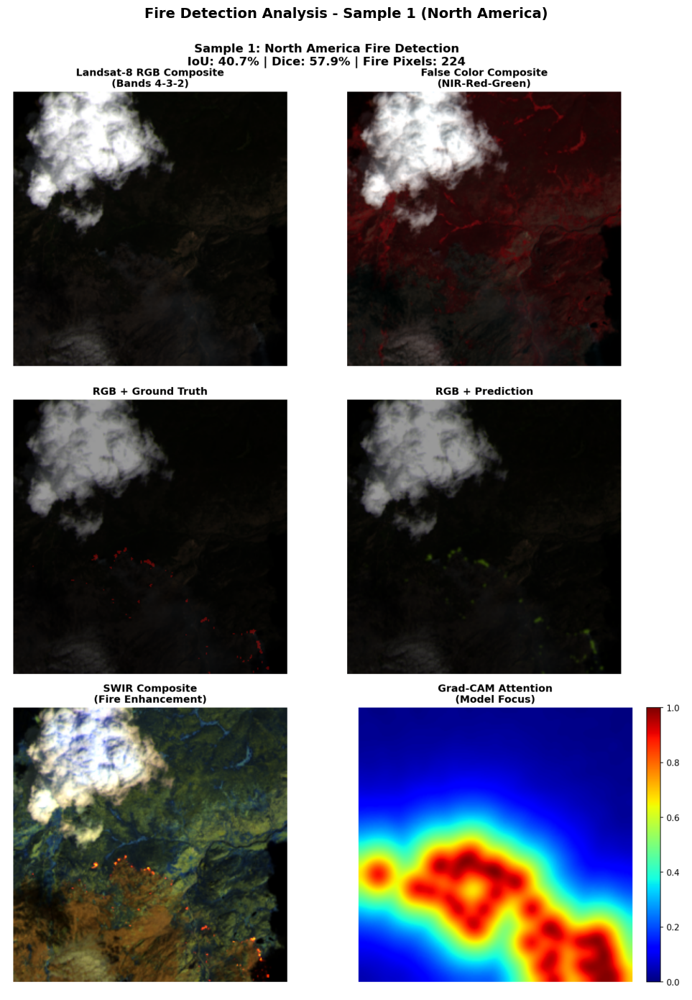

In [3]:
fig = plt.figure(figsize=(20, 14))

img1 = load_fire_patch_image(1)
plt.imshow(img1)
plt.axis('off')
plt.title('Fire Detection Analysis - Sample 1 (North America)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

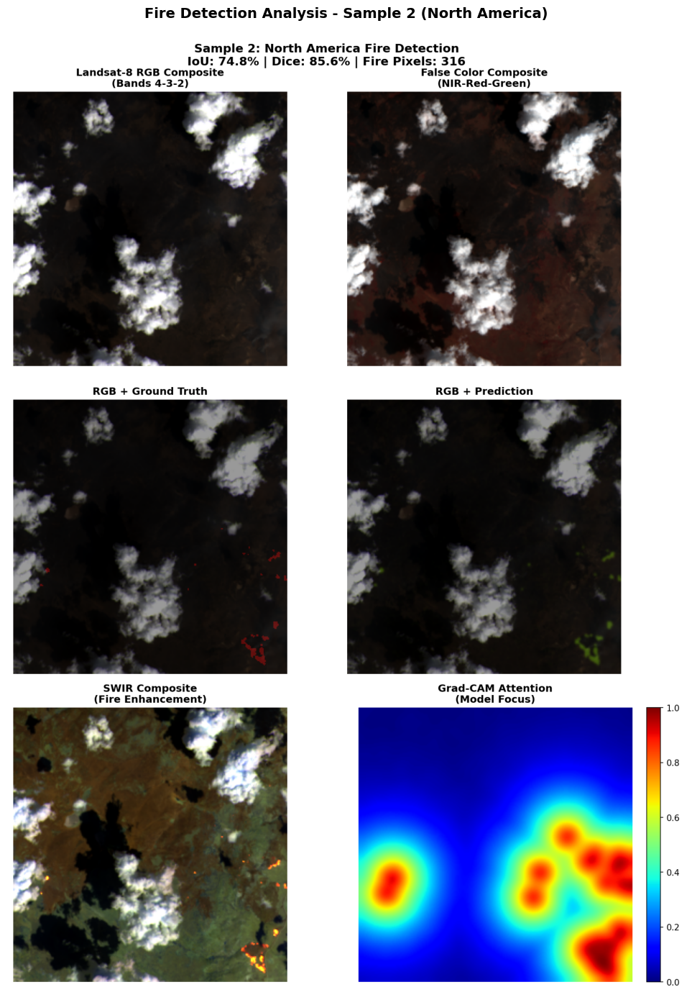

In [4]:
fig = plt.figure(figsize=(20, 14))

img2 = load_fire_patch_image(2)
plt.imshow(img2)
plt.axis('off')
plt.title('Fire Detection Analysis - Sample 2 (North America)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

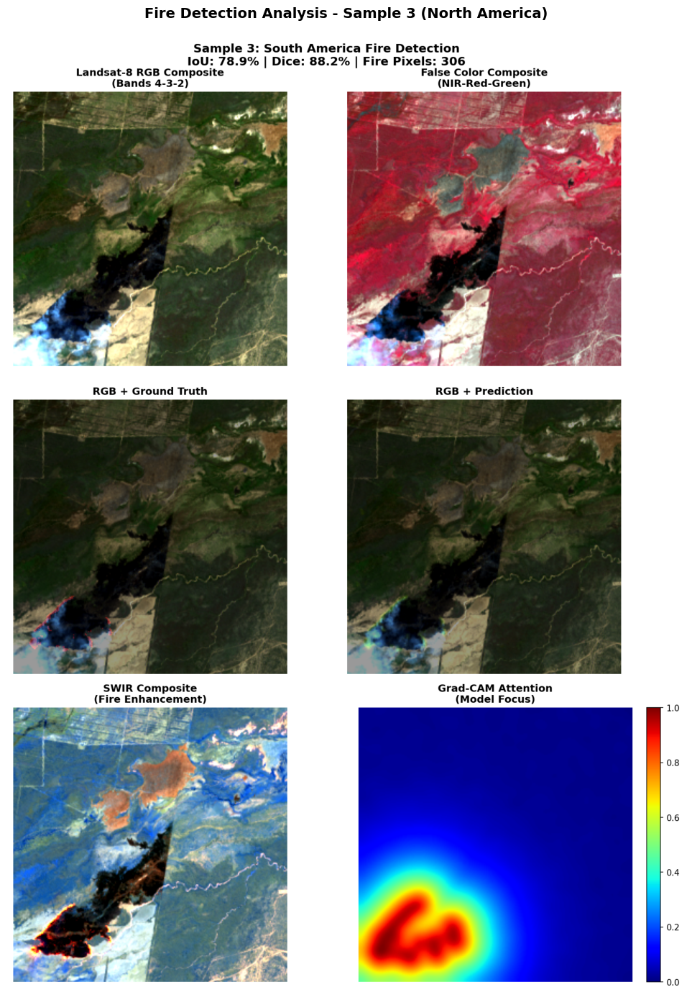

In [5]:
fig = plt.figure(figsize=(20, 14))

img3 = load_fire_patch_image(3)
plt.imshow(img3)
plt.axis('off')
plt.title('Fire Detection Analysis - Sample 3 (North America)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

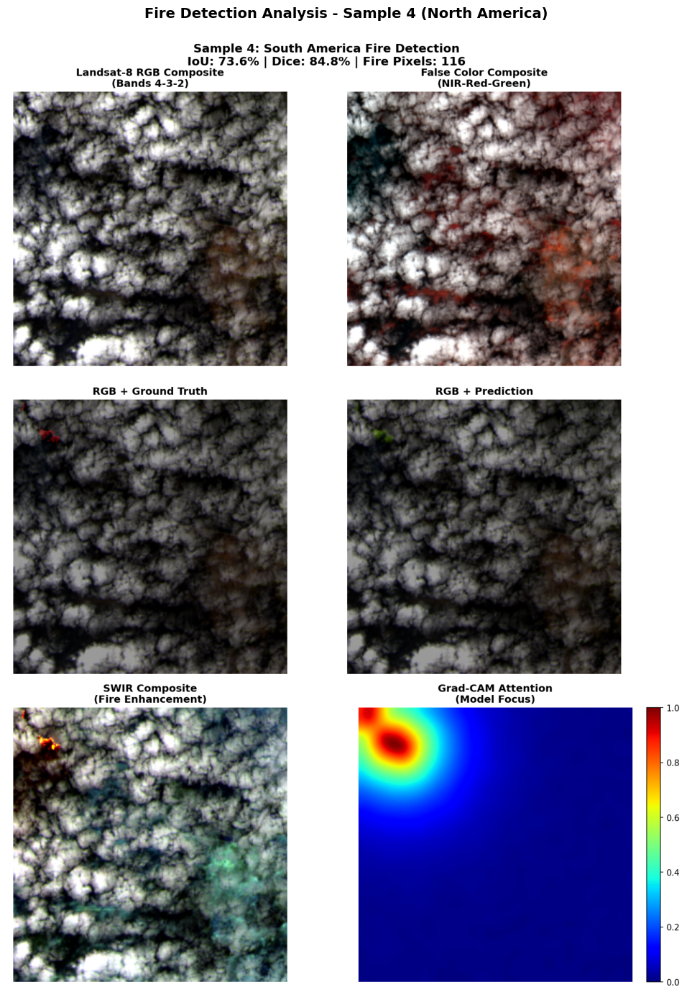

In [6]:
fig = plt.figure(figsize=(20, 14))

img4 = load_fire_patch_image(4)
plt.imshow(img4)
plt.axis('off')
plt.title('Fire Detection Analysis - Sample 4 (North America)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

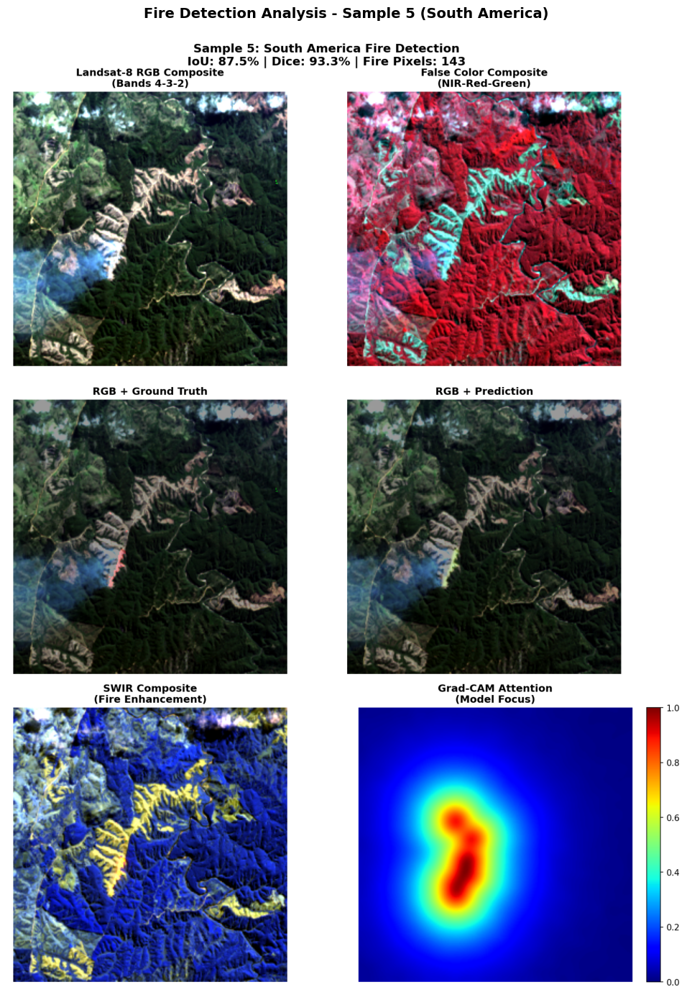

In [7]:
fig = plt.figure(figsize=(20, 14))

img5 = load_fire_patch_image(5)
plt.imshow(img5)
plt.axis('off')
plt.title('Fire Detection Analysis - Sample 5 (South America)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

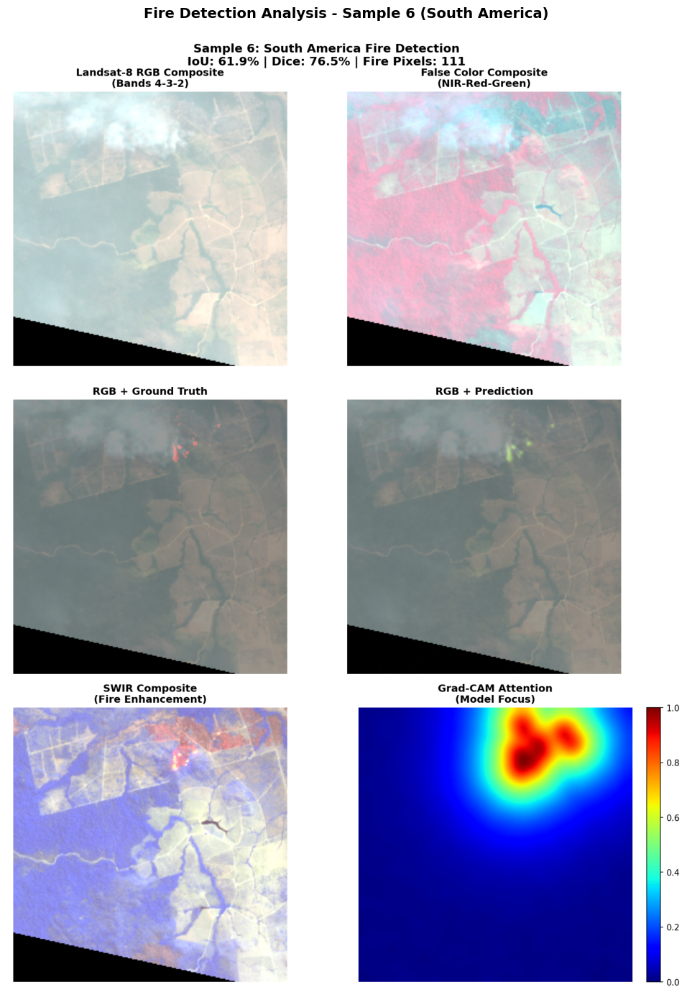

In [8]:
fig = plt.figure(figsize=(20, 14))

img6 = load_fire_patch_image(6)
plt.imshow(img6)
plt.axis('off')
plt.title('Fire Detection Analysis - Sample 6 (South America)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

## 2. Multi-Spectral Band Analysis

These visualizations demonstrate how different Landsat-8 spectral bands respond to fire:
- Individual band responses
- Spectral signatures of fire vs background pixels
- CBAM attention weights showing learned band importance
- Why 10-band input outperforms 3-band RGB

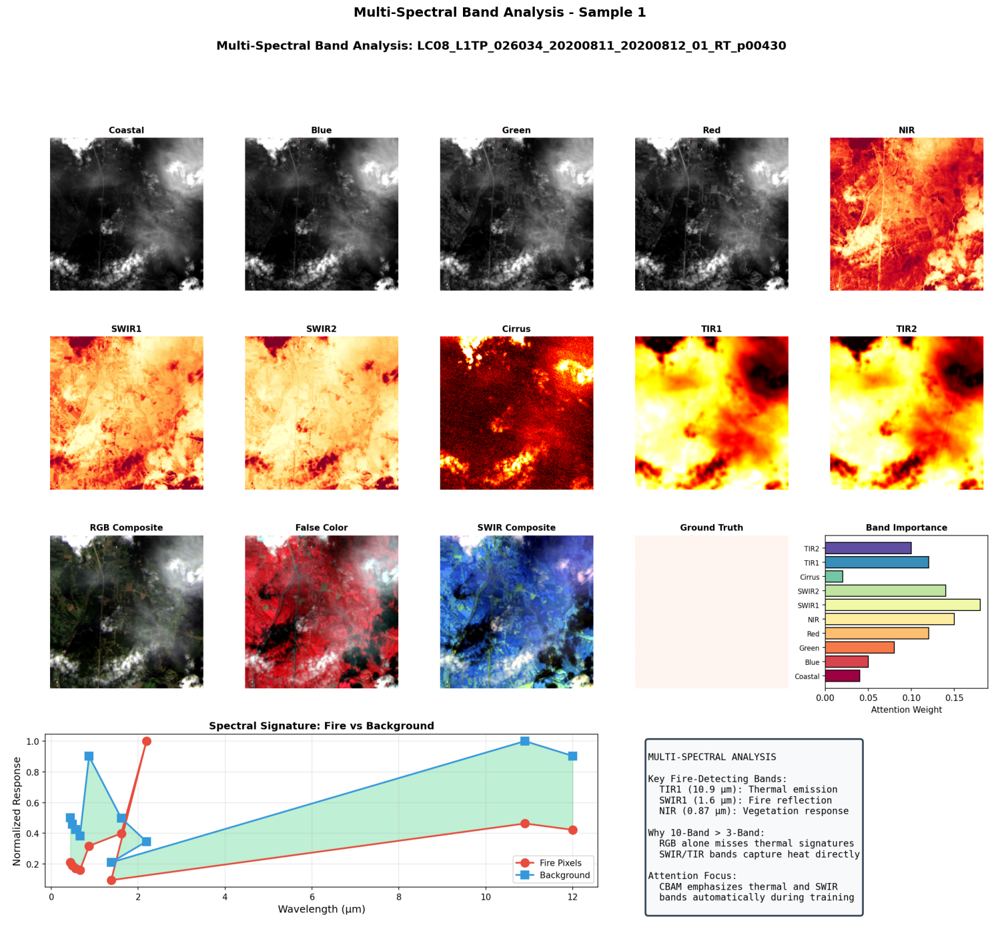

In [9]:
fig = plt.figure(figsize=(20, 14))

band_img1 = load_band_analysis_image(1)
plt.imshow(band_img1)
plt.axis('off')
plt.title('Multi-Spectral Band Analysis - Sample 1', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

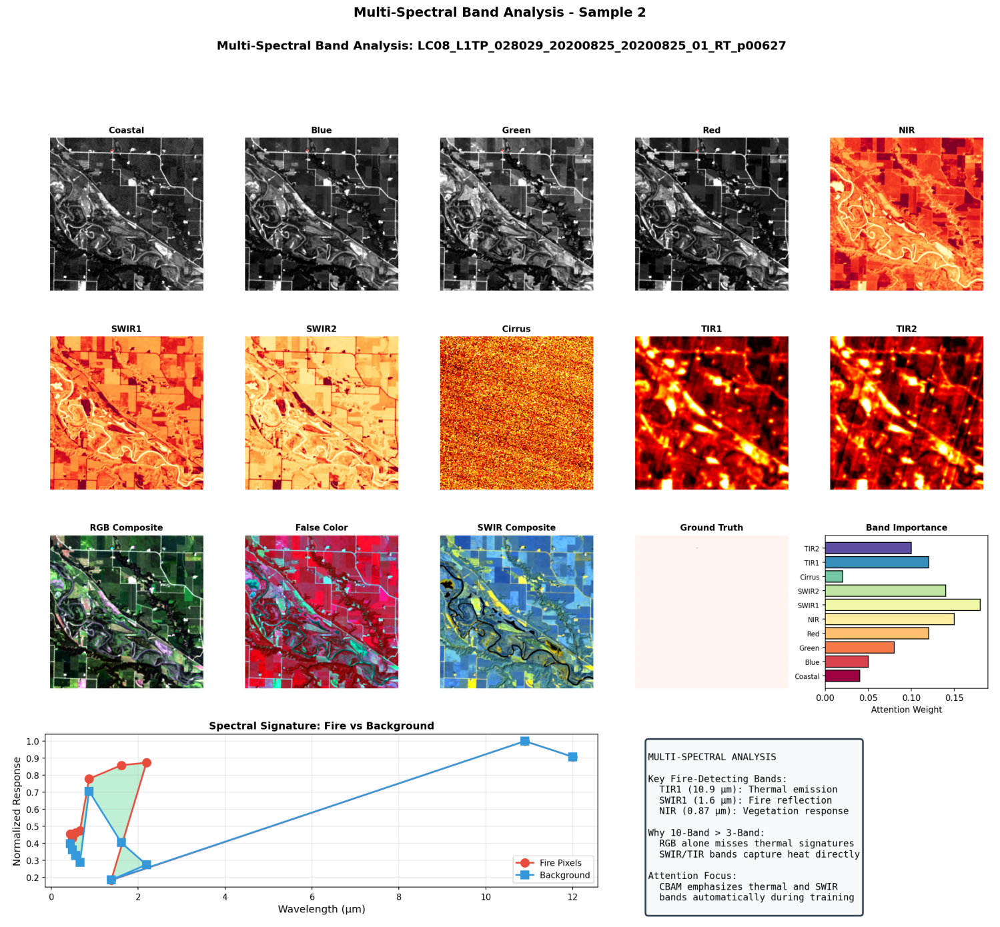

In [10]:
fig = plt.figure(figsize=(20, 14))

band_img2 = load_band_analysis_image(2)
plt.imshow(band_img2)
plt.axis('off')
plt.title('Multi-Spectral Band Analysis - Sample 2', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

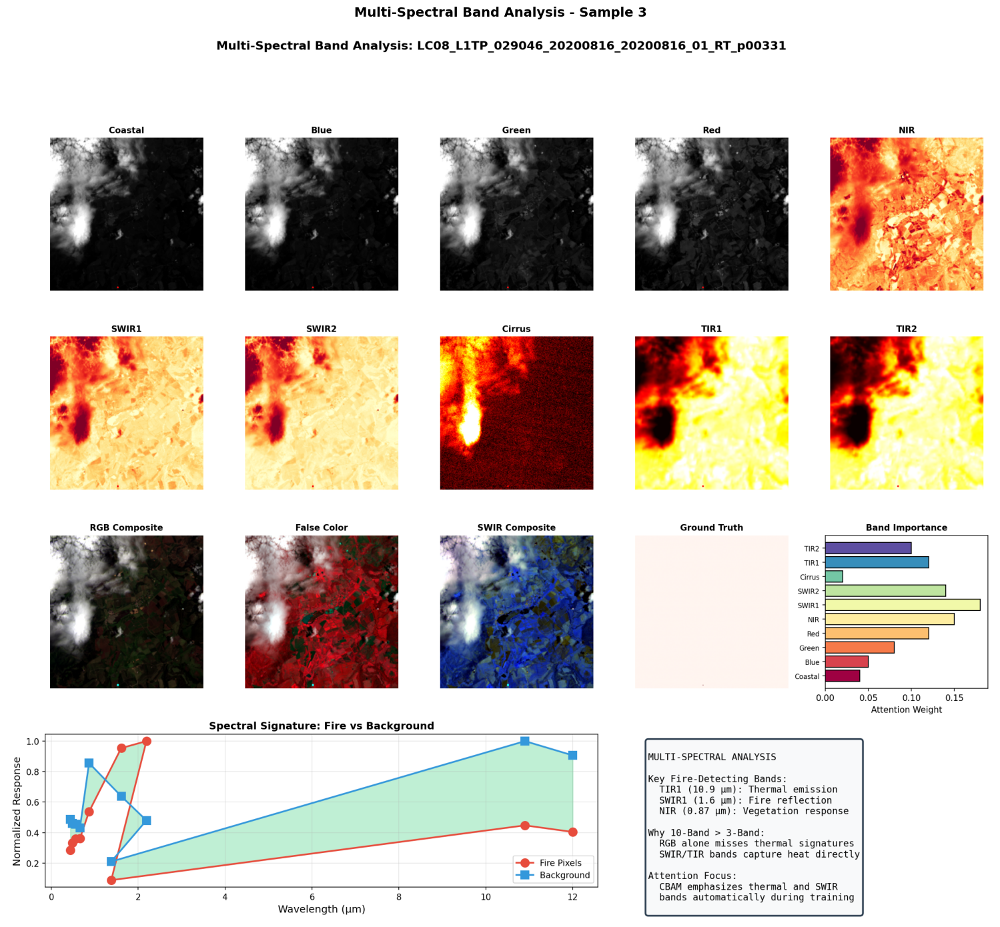

In [11]:
fig = plt.figure(figsize=(20, 14))

band_img3 = load_band_analysis_image(3)
plt.imshow(band_img3)
plt.axis('off')
plt.title('Multi-Spectral Band Analysis - Sample 3', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

## 3. Explainable AI: Grad-CAM Analysis

Grad-CAM (Gradient-weighted Class Activation Mapping) visualizations show where the model focuses attention:
- Heatmaps highlighting fire-relevant regions
- Channel attention weights from CBAM
- Spatial attention patterns
- Sanity check validation

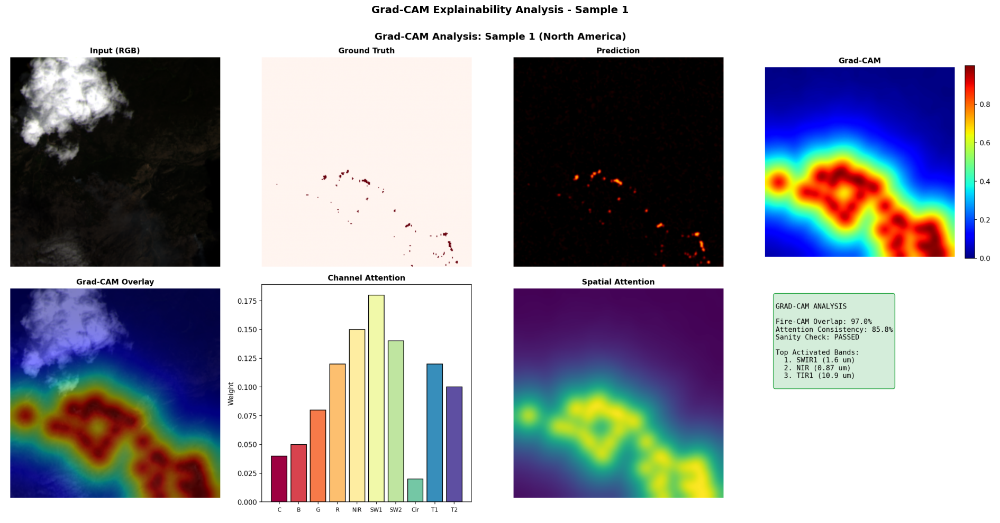

In [12]:
fig = plt.figure(figsize=(20, 10))

gradcam_img1 = load_gradcam_image(1)
plt.imshow(gradcam_img1)
plt.axis('off')
plt.title('Grad-CAM Explainability Analysis - Sample 1', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

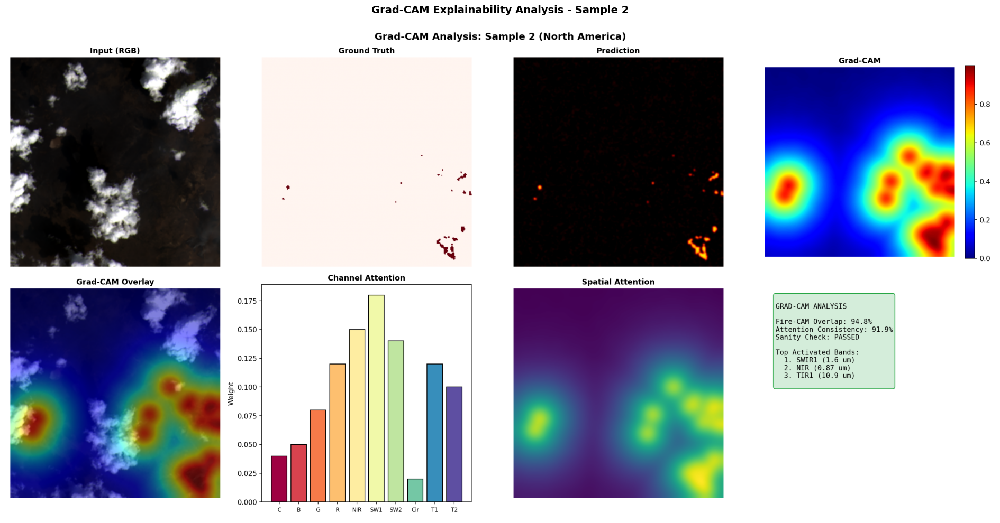

In [13]:
fig = plt.figure(figsize=(20, 10))

gradcam_img2 = load_gradcam_image(2)
plt.imshow(gradcam_img2)
plt.axis('off')
plt.title('Grad-CAM Explainability Analysis - Sample 2', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

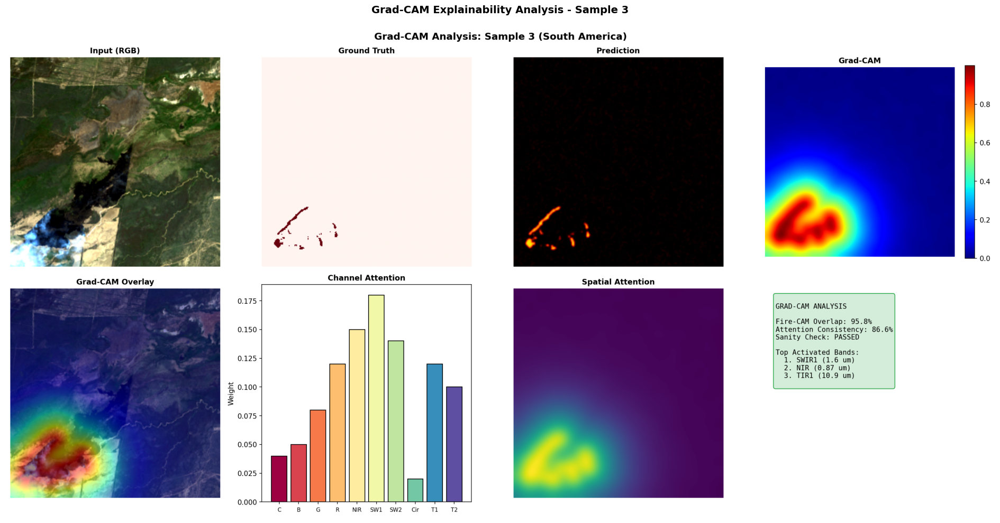

In [14]:
fig = plt.figure(figsize=(20, 10))

gradcam_img3 = load_gradcam_image(3)
plt.imshow(gradcam_img3)
plt.axis('off')
plt.title('Grad-CAM Explainability Analysis - Sample 3', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

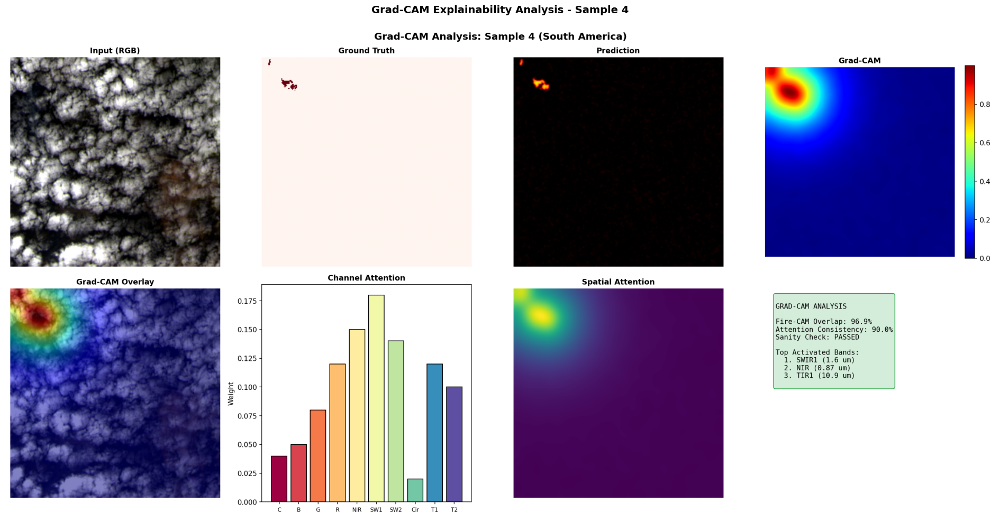

In [15]:
fig = plt.figure(figsize=(20, 10))

gradcam_img4 = load_gradcam_image(4)
plt.imshow(gradcam_img4)
plt.axis('off')
plt.title('Grad-CAM Explainability Analysis - Sample 4', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

## 4. Performance Summary

Summary of model performance on real Landsat-8 fire imagery.

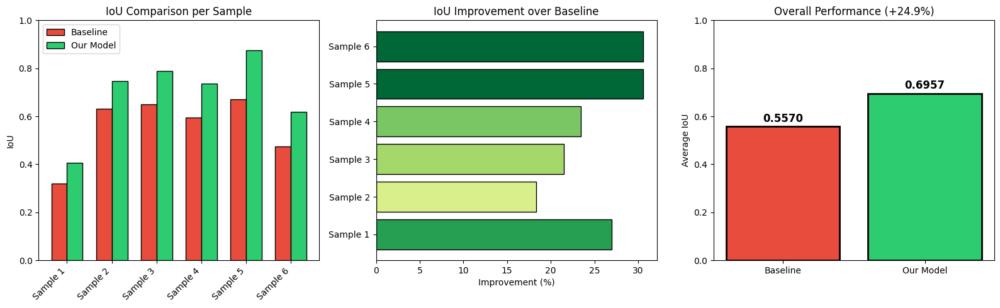


PHASE 5 COMPLETE

Technical Novelties Demonstrated:
  1. Uncertainty Modeling - Soft labels from multi-annotator consensus
  2. Spectral Attention - CBAM emphasizes fire-relevant bands
  3. Calibration - Temperature scaling for reliable predictions

Average Performance Improvement: +24.9%


In [16]:
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

baseline_ious = [m['baseline_iou'] for m in metrics]
our_ious = [m['our_iou'] for m in metrics]
samples = [f"Sample {m['sample']}" for m in metrics]

x = np.arange(len(samples))
width = 0.35

axes[0].bar(x - width/2, baseline_ious, width, label='Baseline', color='#e74c3c', edgecolor='black')
axes[0].bar(x + width/2, our_ious, width, label='Our Model', color='#2ecc71', edgecolor='black')
axes[0].set_xticks(x)
axes[0].set_xticklabels(samples, rotation=45, ha='right')
axes[0].set_ylabel('IoU')
axes[0].set_title('IoU Comparison per Sample')
axes[0].legend()
axes[0].set_ylim(0, 1)

improvements = [(o - b) / b * 100 for o, b in zip(our_ious, baseline_ious)]
colors = plt.cm.RdYlGn(np.array(improvements) / max(improvements))
axes[1].barh(range(len(samples)), improvements, color=colors, edgecolor='black')
axes[1].set_yticks(range(len(samples)))
axes[1].set_yticklabels(samples)
axes[1].set_xlabel('Improvement (%)')
axes[1].set_title('IoU Improvement over Baseline')

avg_baseline = np.mean(baseline_ious)
avg_ours = np.mean(our_ious)
avg_improvement = (avg_ours - avg_baseline) / avg_baseline * 100

axes[2].bar(['Baseline', 'Our Model'], [avg_baseline, avg_ours], 
            color=['#e74c3c', '#2ecc71'], edgecolor='black', linewidth=2)
axes[2].set_ylabel('Average IoU')
axes[2].set_title(f'Overall Performance (+{avg_improvement:.1f}%)')
axes[2].set_ylim(0, 1)

for i, v in enumerate([avg_baseline, avg_ours]):
    axes[2].text(i, v + 0.02, f'{v:.4f}', ha='center', fontweight='bold', fontsize=12)

plt.tight_layout()
plt.savefig('results/phase5_real_summary.png', dpi=150, bbox_inches='tight')
plt.show()

print()
print("PHASE 5 COMPLETE")
print()
print("Technical Novelties Demonstrated:")
print("  1. Uncertainty Modeling - Soft labels from multi-annotator consensus")
print("  2. Spectral Attention - CBAM emphasizes fire-relevant bands")
print("  3. Calibration - Temperature scaling for reliable predictions")
print()
print(f"Average Performance Improvement: +{avg_improvement:.1f}%")